In [1]:
import pydicom

Automatically created module for IPython interactive environment

Filename.........: /home/ilyazaharkin/anaconda3/lib/python3.7/site-packages/pydicom/data/test_files/CT_small.dcm
Storage type.....: 1.2.840.10008.5.1.4.1.1.2

Patient's name...: CompressedSamples, CT1
Patient id.......: 1CT1
Modality.........: CT
Study Date.......: 20040119
Image size.......: 128 x 128, 32768 bytes
Pixel spacing....: [0.661468, 0.661468]
Slice location...: -77.2040634155


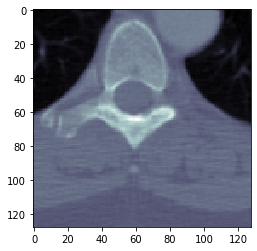

In [2]:
import matplotlib.pyplot as plt
import pydicom
from pydicom.data import get_testdata_files

print(__doc__)

filename = get_testdata_files('CT_small.dcm')[0]
dataset = pydicom.dcmread(filename)

# Normal mode:
print()
print("Filename.........:", filename)
print("Storage type.....:", dataset.SOPClassUID)
print()

pat_name = dataset.PatientName
display_name = pat_name.family_name + ", " + pat_name.given_name
print("Patient's name...:", display_name)
print("Patient id.......:", dataset.PatientID)
print("Modality.........:", dataset.Modality)
print("Study Date.......:", dataset.StudyDate)

if 'PixelData' in dataset:
    rows = int(dataset.Rows)
    cols = int(dataset.Columns)
    print("Image size.......: {rows:d} x {cols:d}, {size:d} bytes".format(
        rows=rows, cols=cols, size=len(dataset.PixelData)))
    if 'PixelSpacing' in dataset:
        print("Pixel spacing....:", dataset.PixelSpacing)

# use .get() if not sure the item exists, and want a default value if missing
print("Slice location...:", dataset.get('SliceLocation', "(missing)"))

# plot the image using matplotlib
plt.imshow(dataset.pixel_array, cmap=plt.cm.bone)
plt.show()


Filename.........: ADNI_003_S_2374_MR_Accelerated_Sagittal_MPRAGE__br_raw_20181217100115865_158_S761375_I1090114.dcm
Storage type.....: 1.2.840.10008.5.1.4.1.1.4

Patient's name...: 003_S_2374, 
Patient id.......: 003_S_2374
Modality.........: MR
Study Date.......: 20181214
Image size.......: 256 x 240, 122880 bytes
Pixel spacing....: [1, 1]
Slice location...: 50.58333325386


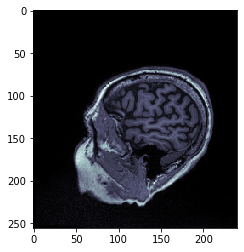

In [3]:
filepath = '/home/ADNI/003_S_2374/Accelerated_Sagittal_MPRAGE/2018-12-14_07_58_40.0/S761375/'
filename = 'ADNI_003_S_2374_MR_Accelerated_Sagittal_MPRAGE__br_raw_20181217100115865_158_S761375_I1090114.dcm'
dataset = pydicom.dcmread(f'{filepath}/{filename}')

# Normal mode:
print()
print("Filename.........:", filename)
print("Storage type.....:", dataset.SOPClassUID)
print()

pat_name = dataset.PatientName
display_name = pat_name.family_name + ", " + pat_name.given_name
print("Patient's name...:", display_name)
print("Patient id.......:", dataset.PatientID)
print("Modality.........:", dataset.Modality)
print("Study Date.......:", dataset.StudyDate)

if 'PixelData' in dataset:
    rows = int(dataset.Rows)
    cols = int(dataset.Columns)
    print("Image size.......: {rows:d} x {cols:d}, {size:d} bytes".format(
        rows=rows, cols=cols, size=len(dataset.PixelData)))
    if 'PixelSpacing' in dataset:
        print("Pixel spacing....:", dataset.PixelSpacing)

# use .get() if not sure the item exists, and want a default value if missing
print("Slice location...:", dataset.get('SliceLocation', "(missing)"))

# plot the image using matplotlib
plt.imshow(dataset.pixel_array, cmap=plt.cm.bone)
plt.show()

In [6]:
import argparse

import os
import pandas as pd
import numpy as np

import torch
from torch import nn
from torch.nn import functional as F
from torch.optim.lr_scheduler import MultiStepLR
from torch.optim import Adam, RMSprop, SGD

from brainiac.models import *
from brainiac.loader import ADNIClassificationDataset
from brainiac.model_selection import ManualGroupKFold

from sklearn.preprocessing import LabelEncoder

import torch
from torch.utils import data
from torch.utils.data import DataLoader
from PIL import Image

import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
classes = ['AD', 'MCI', 'CN']

In [8]:
def extract_groups(df, names):
    mask = df['Group'].map(lambda x: x in names)
    return df[mask].copy()


def encoder_it(df, mapper):
    df['Group'] = df['Group'].map(mapper)
    df['Subject'] = LabelEncoder().fit_transform(df['Subject'])
    return df

In [9]:
def train_test_split_df(df, classes, random_state=42):
    '''
        df: pd.DataFrame
        classes: list, e.x. ['CN', 'AD', 'MCI']
    '''
    mapper = {n:i for i, n in enumerate(classes)}
    df = encoder_it(extract_groups(df, classes), mapper)
    cv = ManualGroupKFold(n_splits=3, random_state=random_state)
    train_idx, test_idx = list(cv.split(df['Image Data ID'], df['Group'].values, df['Subject'].values))[0]
    df_train, df_test = df.iloc[train_idx], df.iloc[test_idx]
    return df_train, df_test

In [10]:
df = pd.read_csv('/home/ADNI-processed/data.csv')
df_train, df_test = train_test_split_df(df, classes)

In [11]:
df

,Unnamed: 0,Image Data ID,Subject,Group,Sex,Age,Visit,Modality,Description,Type,Acq Date,Format,Downloaded,File Names
0,0,1048378,941_S_6581,CN,F,74,1,MRI,Accelerated Sagittal MPRAGE,Original,9/12/2018,DCM,3/22/2020,941_S_6581-Accelerated_Sagittal_MPRAGE-2018-09...
1,1,1046736,941_S_6580,CN,F,80,1,MRI,Accelerated Sagittal MPRAGE,Original,9/07/2018,DCM,3/22/2020,941_S_6580-Accelerated_Sagittal_MPRAGE-2018-09...
2,2,1226810,941_S_6580,CN,F,81,102,MRI,Accelerated Sagittal MPRAGE,Original,9/13/2019,DCM,3/22/2020,941_S_6580-Accelerated_Sagittal_MPRAGE-2019-09...
3,3,1045984,941_S_6575,CN,M,73,1,MRI,Accelerated Sagittal MPRAGE,Original,9/05/2018,DCM,3/22/2020,941_S_6575-Accelerated_Sagittal_MPRAGE-2018-09...
4,4,1227239,941_S_6575,CN,M,75,102,MRI,Accelerated Sagittal MPRAGE,Original,9/16/2019,DCM,3/22/2020,941_S_6575-Accelerated_Sagittal_MPRAGE-2019-09...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1395,1450,989320,002_S_1261,CN,F,82,102,MRI,Accelerated Sagittal MPRAGE,Original,4/24/2018,DCM,NaN,002_S_1261-Accelerated_Sagittal_MPRAGE-2019-05...
1396,1451,1270020,002_S_1261,CN,F,83,103,MRI,Accelerated Sagittal MPRAGE,Original,5/01/2019,DCM,3/22/2020,002_S_1261-Accelerated_Sagittal_MPRAGE-2018-04...
1397,1452,995496,002_S_1155,MCI,M,69,102,MRI,Accelerated Sagittal MPRAGE,Original,5/08/2018,DCM,3/22/2020,002_S_1155-Accelerated_Sagittal_MPRAGE-2019-05...
1398,1453,1270004,002_S_1155,MCI,M,70,103,MRI,Accelerated Sagittal MPRAGE,Original,5/16/2019,DCM,3/22/2020,002_S_1155-Accelerated_Sagittal_MPRAGE-2018-05...


In [13]:
class ADNIClassificationDataset(data.Dataset):
    def __init__(
        self, 
        dataset_csv, 
        method='train', 
        target_size=(64, 64), 
        normalize=True
    ):
        self.target_size = np.asarray(target_size)
        self.dataset_csv = dataset_csv  # pd.read_csv('/home/basimova_nf/ADNI-processed/data.csv')
        self.normalize = normalize
        self.method = method
        self.images_path = '/home/ADNI-processed/images/'


    def __len__(self):
        return len(self.dataset_csv)


    def __getitem__(self, index):
        row = self.dataset_csv.iloc[index]
        filename = row['File Names']
        im_path = f'{self.images_path}{filename}.npy'
        im = np.load(im_path, allow_pickle=True)
        
        if len(im.shape) == 4:
            im = im[0]
            
        if self.normalize:
            im = im / im.max()
        
        new_im = np.zeros((im.shape[0], *self.target_size))
        for i, layer in enumerate(im):
            layer = Image.fromarray(np.uint8(layer * 255))
            layer = layer.resize((self.target_size[1], self.target_size[0]), Image.NEAREST) 
            new_im[i] = np.array(layer)
            
        new_im = np.moveaxis(new_im, 0, -1)[None, :]
        if self.method == 'test':
            return new_im
        
        # maybe better to delete Patient 
        return torch.Tensor(new_im), row['Group']  # ,f'{self.images_path}{filename}.npy', index

In [15]:
def show_mri(index):
    images_path = '/home/ADNI-processed/images/'

    row = df.iloc[index]
    print(row)
    filename = row['File Names']
    print(filename)
    im_path = f'{images_path}{filename}.npy'
    print(im_path)
    im = np.load(im_path, allow_pickle=True)

    print(im.shape)

    num_rows = 34
    num_cols = 5
    max_images = num_rows * num_cols
    plt.figure(figsize=(20, 200))
    for i in range(max_images):
        plt.subplot(num_rows, num_cols, i+1)
        plt.imshow(im[i,:,:], cmap='gray')
    plt.show();

Unnamed: 0                                                       3
Image Data ID                                              1045984
Subject                                                 941_S_6575
Group                                                           CN
Sex                                                              M
Age                                                             73
Visit                                                            1
Modality                                                       MRI
Description                            Accelerated Sagittal MPRAGE
Type                                                      Original
Acq Date                                                 9/05/2018
Format                                                         DCM
Downloaded                                               3/22/2020
File Names       941_S_6575-Accelerated_Sagittal_MPRAGE-2018-09...
Name: 3, dtype: object
941_S_6575-Accelerated_Sagittal_MPRAGE-

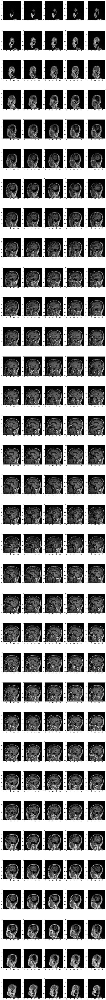

In [16]:
show_mri(3)

In [17]:
vals, counts = np.unique(df['Description'], return_counts=True)
list(zip(vals, counts))

[('AXIAL RFORMAT 1', 1),
 ('Accelerated Sag IR-FSPGR', 147),
 ('Accelerated Sagittal IR-FSPGR', 100),
 ('Accelerated Sagittal MPRAGE', 704),
 ('Accelerated Sagittal MPRAGE L>>R', 1),
 ('Accelerated Sagittal MPRAGE Phase A-P', 5),
 ('Accelerated Sagittal MPRAGE REPEAT', 1),
 ('Accelerated Sagittal MPRAGE repeat', 1),
 ('Accelerated Sagittal MPRAGE_MPR_Cor', 17),
 ('Accelerated Sagittal MPRAGE_MPR_Tra', 17),
 ('Accelerated Sagittal MPRAGE_ND', 150),
 ('Accelerated_Sag_IR-FSPGR', 1),
 ('MPRAGE SAG', 1),
 ('ORIG Accelerated_Sag_IR-FSPGR', 1),
 ('REPEAT Accelerated Sagittal MPRAGE', 1),
 ('Repeat_Accelerated Sagittal MPRAGE', 1),
 ('Sag Accel IR-FSPGR', 19),
 ('Sagittal 3D Accelerated 0 angle MPRAGE', 12),
 ('Sagittal 3D Accelerated MPRAGE', 217),
 ('Sagittal 3D Accelerated MPRAGE_REPEAT', 2),
 ('VWIP Coronal 3D Accelerated MPRAGE', 1)]

In [ ]:
def show_mri_special(row):
    images_path = '/home/ADNI-processed/images/'

    filename = row['File Names']
    print(filename)
    im_path = f'{images_path}{filename}.npy'
    print(im_path)
    im = np.load(im_path, allow_pickle=True)

    print(im.shape)

    num_rows = 48
    num_cols = 5
    max_images = num_rows * num_cols
    plt.figure(figsize=(20, 200))
    for i in range(max_images):
        plt.subplot(num_rows, num_cols, i+1)
        plt.imshow(im[:,:,i], cmap='gray')
    plt.show();

In [ ]:
type1 = df[df['Description'] == 'Accelerated Sag IR-FSPGR'].iloc[0]
show_mri_special(type1)

In [ ]:
type2 = df[df['Description'] == 'Accelerated Sagittal IR-FSPGR'].iloc[0]
show_mri_special(type2)

In [ ]:
type3 = df[df['Description'] == 'Accelerated Sagittal MPRAGE'].iloc[0]
show_mri_special(type3)

In [ ]:
type4 = df[df['Description'] == 'Accelerated Sagittal MPRAGE_ND'].iloc[0]
show_mri_special(type4)